In [1]:
from zipfile import ZipFile
import pandas as pd
import os, time
import shutil
import sys
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from tensorflow import keras
import random
from tqdm.notebook import tqdm, trange
import data.pano_loader as loader
from data import data
import onnxruntime

os.environ["OPENCV_IO_ENABLE_OPENEXR"]="1"
os.environ["CUDA_VISIBLE_DEVICES"]="0"
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"]="true"

import cv2

2022-12-07 23:20:23.505117: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [2]:
pano_path = "/data3/awong/pano/M3D_low/"
test = loader.generate_dataframe("./splits/M3D_v1_test.yaml", pano_path)
test_generator = data.DataGenerator(
            test, batch_size=32, shuffle=False, wrap=64
)

In [15]:
from sklearn.metrics import mean_squared_error, mean_squared_log_error

def abs_rel_err(pred, expected):
    return np.mean(np.divide(np.abs(pred - expected), expected))

def sq_rel_err(pred, expected):
    return np.mean(np.divide(np.square(pred - expected), expected))

def root_mean_sq_err(pred, expected):
#     return np.sqrt(np.mean((pred-expected)**2))
    return np.sqrt(np.square(np.subtract(y_actual,y_predicted)).mean())

def root_mean_sq_err_log(pred, expected):
    return np.sqrt(np.mean((np.log2(pred)-np.log2(expected))**2))

# https://github.com/nianticlabs/monodepth2/blob/master/evaluate_depth.py
def compute_errors(gt, pred):
    """Computation of error metrics between predicted and ground truth depths
    """
    # prevent divide by 0
    gt = np.squeeze(gt)
    pred = np.squeeze(pred)
    
    gt += 1e-7
    pred += 1e-7
    
    thresh = np.maximum((gt / pred), (pred / gt))
    a1 = (thresh < 1.25     ).mean()
    a2 = (thresh < 1.25 ** 2).mean()
    a3 = (thresh < 1.25 ** 3).mean()
    
    rmse = mean_squared_error(gt, pred, squared=False)
    rmse_log = mean_squared_log_error(gt, pred, squared=False)

#     rmse = (gt - pred) ** 2
#     rmse = np.sqrt(rmse.mean())
#     rmse_log = (np.log(gt) - np.log(pred)) ** 2
#     rmse_log = np.sqrt(rmse_log.mean())
    
    abs_rel = np.mean(np.abs(gt - pred) / gt)

    sq_rel = np.mean(((gt - pred) ** 2) / gt)

    return abs_rel, sq_rel, rmse, rmse_log, a1, a2, a3

def calculate_errors(model, test_gen):
    absrel = 0
    sqrel = 0
    rmse = 0
    rmse_log = 0
    a1 = 0
    a2 = 0
    a3 = 0
    
    num = len(test_gen.images)
    
    for i in trange(len(test_gen)):
        img, depths = test_gen[i]
        preds = model.predict(img)

        for p, d in zip(preds, depths):
            ab, sq, rm, rm_log, _a1, _a2, _a3 = compute_errors(d, p)
            absrel += ab
            sqrel += sq
            rmse += rm
            rmse_log += rm_log
            a1 += _a1
            a2 += _a2
            a3 += _a3
        
    print("Abs Rel: %0.2f | Sq Rel: %0.2f | RMSE: %0.2f | RMSE log: %0.2f | a1: %0.2f | a2: %0.2f | a3: %0.2f" % (absrel / num, sqrel / num, rmse / num, rmse_log / num, a1 / num, a2 / num, a3 / num))
    return absrel, sqrel, rmse, rmse_log, a1, a2, a3

def calculate_errors_onnx(sess, test_gen):
    absrel = 0
    sqrel = 0
    rmse = 0
    rmse_log = 0
    a1 = 0
    a2 = 0
    a3 = 0
    
    num = len(test_gen.images)
    inputs = sess.get_inputs()[0].name
    output = sess.get_outputs()[0].name
    
#     print(inputs, output, sess.get_outputs()[0].shape)
    
    for i in trange(len(test_gen)):
        img, depths = test_gen[i]
        preds = sess.run([output], {inputs: img})[0]
#         print(img[0].shape, depths[0].shape, preds[0].shape)

        for p, d in zip(preds, depths):
#             print(p.shape, d.shape)
            ab, sq, rm, rm_log, _a1, _a2, _a3 = compute_errors(d, p)
            absrel += ab
            sqrel += sq
            rmse += rm
            rmse_log += rm_log
            a1 += _a1
            a2 += _a2
            a3 += _a3
        
    print("Abs Rel: %0.2f | Sq Rel: %0.2f | RMSE: %0.2f | RMSE log: %0.2f | a1: %0.2f | a2: %0.2f | a3: %0.2f" % (absrel / num, sqrel / num, rmse / num, rmse_log / num, a1 / num, a2 / num, a3 / num))
    return absrel, sqrel, rmse, rmse_log, a1, a2, a3

In [16]:
from loss_utils import set_loss_function
keras.backend.clear_session()

loss = set_loss_function(["ssim"])

custom_func = {"new_new_loss": loss, "loss_function": loss}
model = tf.keras.models.load_model('./mobile_diode_pano_ssim_l1_sobel_edges_old_preprocess.h5', custom_objects=custom_func)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 640, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 128, 320, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 128, 320, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 128, 320, 32) 0           bn_Conv1[0][0]                   
______________________________________________________________________________________________

In [17]:
calculate_errors(model, test_generator)

  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 5.02 | Sq Rel: 0.54 | RMSE: 0.07 | RMSE log: 0.05 | a1: 0.54 | a2: 0.78 | a3: 0.87


(7672.521824747324,
 830.8656843476929,
 102.78648710530251,
 75.46780203189701,
 831.6712951660146,
 1184.1012817382807,
 1334.6391418457042)

In [5]:
data = []

vals = ['ssim l1',
 'ssim l1 berhu sobel edges',
 'ssim berhu',
 'ssim berhu sobel edges smooth',
 'ssim sobel edges smooth',
 'ssim berhu sobel',
 'ssim berhu sobel edges',
 'ssim l1 sobel edges smooth',
 'ssim sobel',
 'ssim berhu smooth',
 'ssim l1 sobel smooth',
 'ssim l1 berhu edges smooth',
 'ssim l1 edges',
 'ssim l1 berhu sobel edges smooth',
 'edges',
 'ssim berhu edges smooth',
 'ssim sobel edges',
 'ssim l1 berhu edges',
 'ssim l1 berhu sobel smooth',
 'sobel',
 'smooth',
 'ssim l1 sobel',
 'ssim berhu sobel smooth',
 'l1',
 'berhu',
 'ssim l1 smooth',
 'ssim edges smooth',
 'ssim l1 berhu',
 'ssim sobel smooth',
 'ssim edges',
 'ssim l1 berhu smooth',
 'ssim l1 berhu sobel',
 'ssim',
 'ssim l1 sobel edges',
 'ssim berhu edges',
 'ssim l1 edges smooth',
 'ssim smooth']

for v in vals:
    v = v.split(" ")
    d = "_".join(v)
    data.append(f"./result/shuffle_pano_skip_scene_sigmoid_{d}.h5")

In [14]:
import glob
from utils import set_loss_function
from models.TCSVT import *

loss = set_loss_function(["ssim"])
custom_func = {"new_new_loss": loss, "loss_function": loss, "DownSampling": DownSampling, "UpSampling": UpSampling, "Scene_Understanding": Scene_Understanding }

for name in glob.glob('./new_mobile/*.h5'):
# for name in data:
    keras.backend.clear_session()
    print(name)
    model = tf.keras.models.load_model(name, custom_objects=custom_func)
    calculate_errors(model, test_generator)

./new_mobile/mobile_ssim_l1.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 11.10 | Sq Rel: 1.14 | RMSE: 0.08 | RMSE log: 0.52 | a1: 0.51 | a2: 0.75 | a3: 0.86
./new_mobile/mobile_ssim_l1_berhu.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.64 | Sq Rel: 1.01 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.52 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_berhu_edges_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.01 | Sq Rel: 0.98 | RMSE: 0.07 | RMSE log: 0.48 | a1: 0.53 | a2: 0.78 | a3: 0.87
./new_mobile/mobile_ssim.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 14.75 | Sq Rel: 1.61 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.54 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_berhu_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.33 | Sq Rel: 0.86 | RMSE: 0.08 | RMSE log: 0.49 | a1: 0.53 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_berhu_sobel_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.82 | Sq Rel: 1.10 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.53 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_berhu_sobel_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.68 | Sq Rel: 1.03 | RMSE: 0.07 | RMSE log: 0.50 | a1: 0.54 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_berhu_sobel_edges_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 8.61 | Sq Rel: 0.94 | RMSE: 0.08 | RMSE log: 0.49 | a1: 0.54 | a2: 0.78 | a3: 0.88
./new_mobile/mobile_ssim_l1_sobel_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 11.89 | Sq Rel: 1.30 | RMSE: 0.08 | RMSE log: 0.54 | a1: 0.50 | a2: 0.74 | a3: 0.85
./new_mobile/mobile_ssim_berhu_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.42 | Sq Rel: 0.91 | RMSE: 0.08 | RMSE log: 0.48 | a1: 0.54 | a2: 0.78 | a3: 0.88
./new_mobile/mobile_ssim_l1_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 10.06 | Sq Rel: 1.05 | RMSE: 0.08 | RMSE log: 0.52 | a1: 0.50 | a2: 0.74 | a3: 0.86
./new_mobile/mobile_ssim_l1_berhu_edges_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 10.55 | Sq Rel: 1.06 | RMSE: 0.08 | RMSE log: 0.51 | a1: 0.51 | a2: 0.76 | a3: 0.86
./new_mobile/mobile_l1.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 10.80 | Sq Rel: 1.11 | RMSE: 0.08 | RMSE log: 0.51 | a1: 0.53 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_l1_berhu_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.83 | Sq Rel: 0.93 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.53 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_l1_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.28 | Sq Rel: 0.98 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.52 | a2: 0.76 | a3: 0.87
./new_mobile/mobile_ssim_l1_berhu_sobel_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.31 | Sq Rel: 1.01 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.53 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 252.56 | Sq Rel: 243.48 | RMSE: 0.79 | RMSE log: 2.27 | a1: 0.03 | a2: 0.05 | a3: 0.07
./new_mobile/mobile_ssim_l1_berhu_sobel.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 10.04 | Sq Rel: 1.12 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.52 | a2: 0.76 | a3: 0.87
./new_mobile/mobile_ssim_l1_sobel_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 11.04 | Sq Rel: 1.16 | RMSE: 0.08 | RMSE log: 0.53 | a1: 0.50 | a2: 0.74 | a3: 0.85
./new_mobile/mobile_ssim_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 6.99 | Sq Rel: 0.57 | RMSE: 0.09 | RMSE log: 0.50 | a1: 0.54 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_berhu.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 10.45 | Sq Rel: 1.03 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.52 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_sobel_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 8.20 | Sq Rel: 0.81 | RMSE: 0.08 | RMSE log: 0.48 | a1: 0.55 | a2: 0.79 | a3: 0.88
./new_mobile/mobile_ssim_sobel_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 8.47 | Sq Rel: 0.88 | RMSE: 0.08 | RMSE log: 0.48 | a1: 0.55 | a2: 0.78 | a3: 0.88
./new_mobile/mobile_ssim_l1_edges_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 10.17 | Sq Rel: 1.08 | RMSE: 0.08 | RMSE log: 0.51 | a1: 0.52 | a2: 0.76 | a3: 0.87
./new_mobile/mobile_ssim_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 7.16 | Sq Rel: 0.57 | RMSE: 0.09 | RMSE log: 0.50 | a1: 0.54 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_l1_berhu_sobel_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.06 | Sq Rel: 0.99 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.53 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_ssim_l1_sobel.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.32 | Sq Rel: 0.92 | RMSE: 0.08 | RMSE log: 0.50 | a1: 0.53 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_berhu.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 11.84 | Sq Rel: 1.16 | RMSE: 0.08 | RMSE log: 0.52 | a1: 0.48 | a2: 0.75 | a3: 0.86
./new_mobile/mobile_ssim_edges_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.31 | Sq Rel: 0.80 | RMSE: 0.09 | RMSE log: 0.50 | a1: 0.54 | a2: 0.78 | a3: 0.87
./new_mobile/mobile_ssim_l1_berhu_edges.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 10.14 | Sq Rel: 1.04 | RMSE: 0.08 | RMSE log: 0.51 | a1: 0.51 | a2: 0.76 | a3: 0.87
./new_mobile/mobile_sobel.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 149.10 | Sq Rel: 94.82 | RMSE: 0.60 | RMSE log: 1.99 | a1: 0.04 | a2: 0.06 | a3: 0.10
./new_mobile/mobile_ssim_sobel.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 5.83 | Sq Rel: 0.50 | RMSE: 0.08 | RMSE log: 0.47 | a1: 0.55 | a2: 0.78 | a3: 0.88
./new_mobile/mobile_ssim_berhu_sobel.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 8.94 | Sq Rel: 0.96 | RMSE: 0.08 | RMSE log: 0.49 | a1: 0.54 | a2: 0.78 | a3: 0.88
./new_mobile/mobile_ssim_l1_berhu_sobel_edges_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 9.26 | Sq Rel: 1.03 | RMSE: 0.07 | RMSE log: 0.49 | a1: 0.54 | a2: 0.78 | a3: 0.87
./new_mobile/mobile_ssim_l1_sobel_edges_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 12.41 | Sq Rel: 1.36 | RMSE: 0.08 | RMSE log: 0.53 | a1: 0.50 | a2: 0.74 | a3: 0.85
./new_mobile/mobile_ssim_sobel_edges_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 8.73 | Sq Rel: 0.90 | RMSE: 0.08 | RMSE log: 0.49 | a1: 0.54 | a2: 0.77 | a3: 0.87
./new_mobile/mobile_smooth.h5


  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 264.14 | Sq Rel: 263.34 | RMSE: 0.82 | RMSE log: 2.31 | a1: 0.03 | a2: 0.05 | a3: 0.07


In [31]:
imgs, depths = test_generator[0]

In [26]:
keras.backend.clear_session()
from loss_utils import set_loss_function

loss = set_loss_function(["ssim"])
custom_func = {"new_new_loss": loss, "loss_function": loss}

model = tf.keras.models.load_model('./mobilenet/mobile_ssim_l1_sobel_edges.h5', custom_objects=custom_func)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 640, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 128, 320, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 128, 320, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 128, 320, 32) 0           bn_Conv1[0][0]                   
______________________________________________________________________________________________

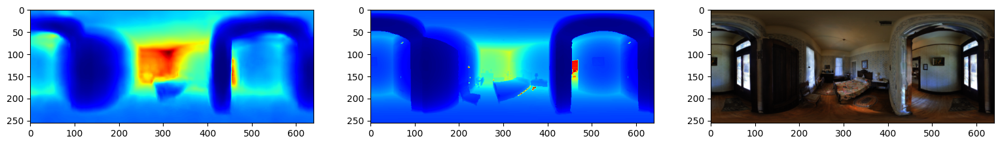

In [27]:
preds = model.predict(imgs)
cmap = plt.cm.jet
cmap.set_bad(color='black')

for pred, depth, img in zip(preds[:1], depths[:1], imgs[:1]):
#     start = time.time()
#     print(time.time() - start)
    
    plt.figure(figsize=(19,10))
    plt.subplot(1,3,1)
    plt.imshow(pred.squeeze(), cmap=cmap)
    plt.subplot(1,3,2)
    plt.imshow(depth.squeeze(), cmap=cmap)
    plt.subplot(1,3,3)
    plt.imshow(img)

In [5]:
keras.backend.clear_session()

model = tf.keras.models.load_model('./mobile_diode_pano_ssim_l1_sobel_edges.h5', custom_objects=custom_func)
model.summary()

NameError: name 'custom_func' is not defined

In [6]:
preds = model.predict(imgs)
cmap = plt.cm.jet
cmap.set_bad(color='black')

for pred, depth, img in zip(preds[:20], depths[:20], imgs[:20]):
    start = time.time()
    print(time.time() - start)
    
    plt.figure(figsize=(19,10))
    plt.subplot(1,3,1)
    plt.imshow(pred.squeeze(), cmap=cmap)
    plt.subplot(1,3,2)
    plt.imshow(depth.squeeze(), cmap=cmap)
    plt.subplot(1,3,3)
    plt.imshow(img)

NameError: name 'model' is not defined

In [9]:
sess = onnxruntime.InferenceSession("mobile_diode_pano_ssim_l1_sobel_edges_old_preprocess.onnx", providers=["TensorrtExecutionProvider"])
calculate_errors_onnx(sess, test_generator)

  0%|          | 0/47 [00:00<?, ?it/s]

Abs Rel: 5.07 | Sq Rel: 0.51 | RMSE: 0.08 | RMSE log: 0.48 | a1: 0.54 | a2: 0.77 | a3: 0.87


(7739.707352116704,
 780.379234722117,
 126.33920923806727,
 725.5183159857988,
 830.3002746582039,
 1183.3634765624997,
 1331.9369750976555)

(32, 256, 640, 1)
7.152557373046875e-06
7.152557373046875e-07
1.1920928955078125e-06
1.1920928955078125e-06
9.5367431640625e-07
9.5367431640625e-07
9.5367431640625e-07
1.1920928955078125e-06
7.152557373046875e-07
9.5367431640625e-07
1.1920928955078125e-06
1.430511474609375e-06
9.5367431640625e-07
1.430511474609375e-06
9.5367431640625e-07
9.5367431640625e-07
9.5367431640625e-07
1.430511474609375e-06
9.5367431640625e-07
1.430511474609375e-06


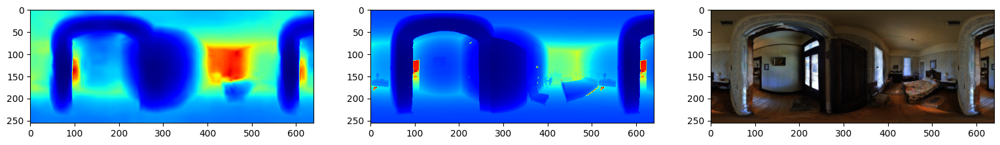

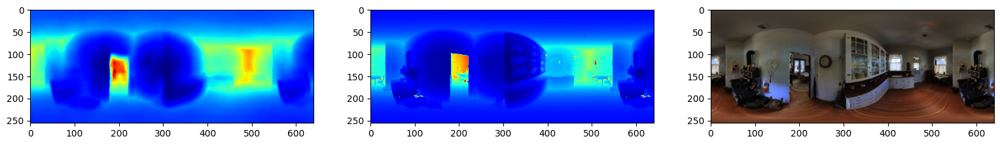

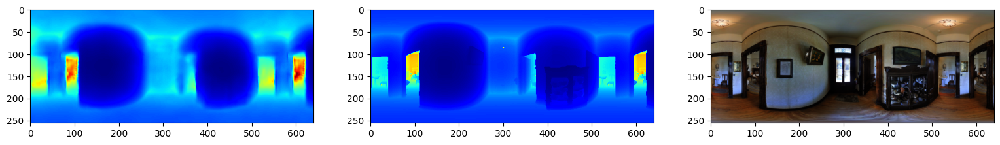

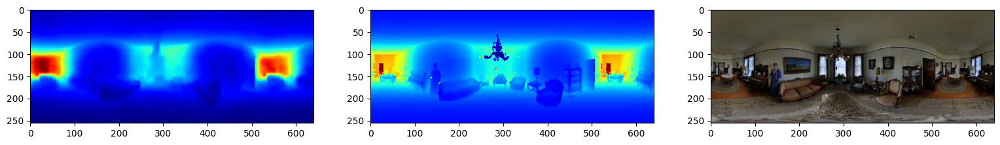

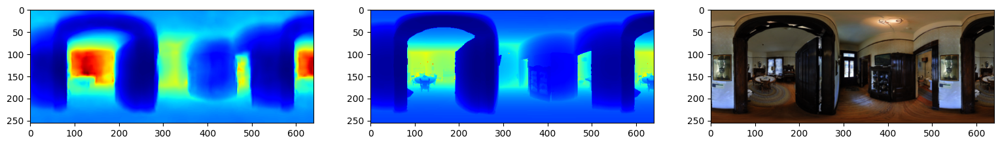

...

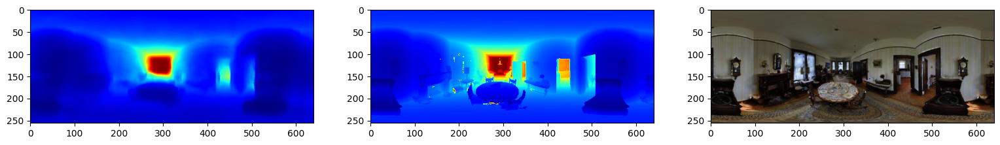

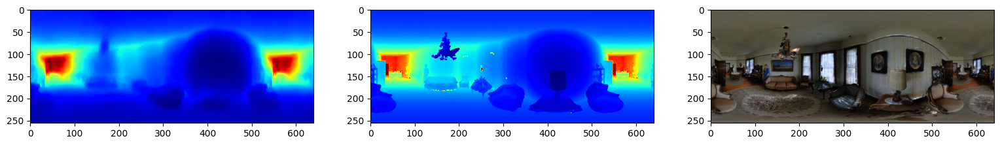

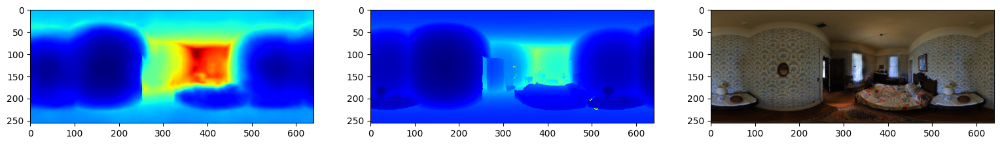

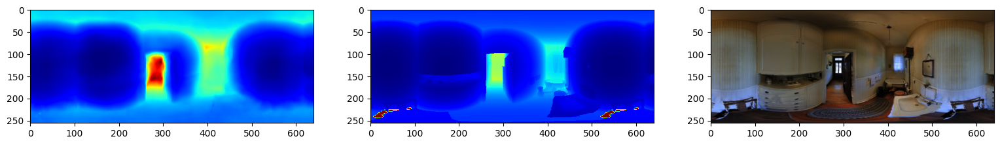

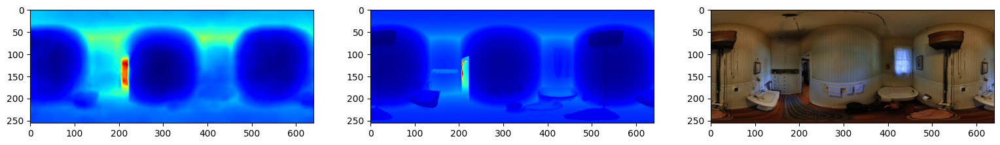

In [10]:
imgs, depths = test_generator[0]

inputs = sess.get_inputs()[0].name
output = sess.get_outputs()[0].name
preds = sess.run([output], {inputs: imgs})[0]
print(preds.shape)

cmap = plt.cm.jet
cmap.set_bad(color='black')

for pred, depth, img in zip(preds[:20], depths[:20], imgs[:20]):
    start = time.time()
    print(time.time() - start)
    
    plt.figure(figsize=(19,10))
    plt.subplot(1,3,1)
    plt.imshow(pred.squeeze(), cmap=cmap)
    plt.subplot(1,3,2)
    plt.imshow(depth.squeeze(), cmap=cmap)
    plt.subplot(1,3,3)
    plt.imshow(img)

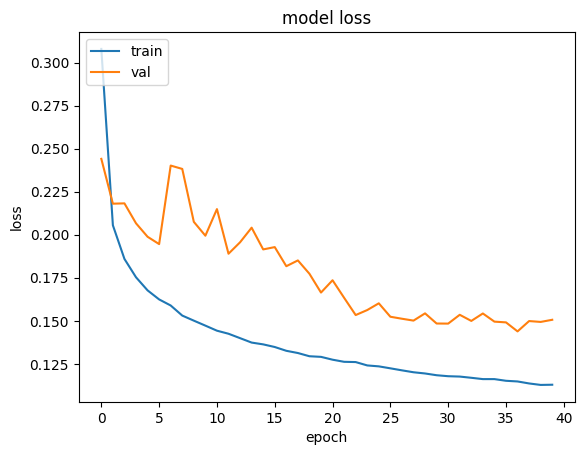

In [12]:
import pickle
file = open("./mobilenet/mobile_ssim_edges_smooth.history", "rb")
losses = pickle.load(file)
plt.plot(losses["loss"])
plt.plot(losses['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

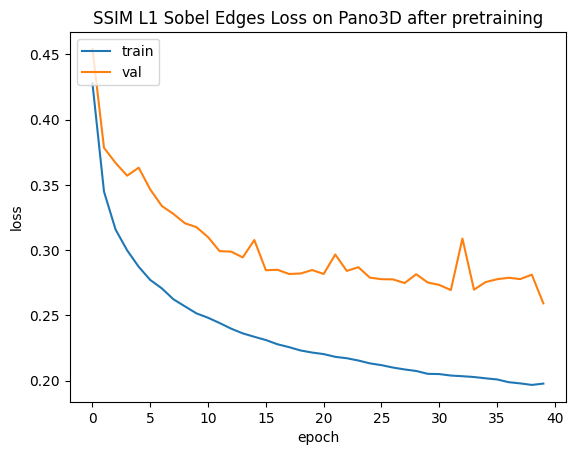

In [20]:
import pickle
import matplotlib.pyplot as plt

file = open("./mobile_diode_pano_ssim_l1_sobel_edges_old_preprocess.history", "rb")
losses = pickle.load(file)
plt.plot(losses["loss"])
plt.plot(losses['val_loss'])
plt.title('SSIM L1 Sobel Edges Loss on Pano3D after pretraining')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [39]:
import glob
from loss_utils import set_loss_function
from models.TCSVT import *

loss = set_loss_function(["ssim"])
custom_func = {"new_new_loss": loss, "loss_function": loss, "DownSampling": DownSampling, "UpSampling": UpSampling, "Scene_Understanding": Scene_Understanding }

resulting_images = {}
img = imgs[0]
depth = depths[0]

for name in glob.glob('./mobilenet/*.h5'):
# for name in data:
    keras.backend.clear_session()
    print(name)
    model = tf.keras.models.load_model(name, custom_objects=custom_func)
    preds = model.predict(imgs)
    resulting_images[name] = preds[0]
#     break

./mobilenet/mobile_ssim_l1.h5
./mobilenet/mobile_ssim_l1_berhu.h5
./mobilenet/mobile_ssim_berhu_edges_smooth.h5
./mobilenet/mobile_ssim.h5
./mobilenet/mobile_ssim_berhu_smooth.h5
./mobilenet/mobile_ssim_berhu_sobel_smooth.h5
./mobilenet/mobile_ssim_berhu_sobel_edges.h5
./mobilenet/mobile_ssim_berhu_sobel_edges_smooth.h5
./mobilenet/mobile_ssim_l1_sobel_smooth.h5
./mobilenet/mobile_ssim_berhu_edges.h5
./mobilenet/mobile_ssim_l1_smooth.h5


./mobilenet/mobile_ssim_l1_berhu_edges_smooth.h5
./mobilenet/mobile_l1.h5
./mobilenet/mobile_ssim_l1_berhu_smooth.h5
./mobilenet/mobile_ssim_l1_edges.h5
./mobilenet/mobile_ssim_l1_berhu_sobel_edges.h5
./mobilenet/mobile_edges.h5
./mobilenet/mobile_ssim_l1_berhu_sobel.h5
./mobilenet/mobile_ssim_l1_sobel_edges.h5
./mobilenet/mobile_ssim_edges.h5
./mobilenet/mobile_ssim_berhu.h5
./mobilenet/mobile_ssim_sobel_edges.h5


./mobilenet/mobile_ssim_sobel_smooth.h5
./mobilenet/mobile_ssim_l1_edges_smooth.h5
./mobilenet/mobile_ssim_smooth.h5
./mobilenet/mobile_ssim_l1_berhu_sobel_smooth.h5
./mobilenet/mobile_ssim_l1_sobel.h5
./mobilenet/mobile_berhu.h5
./mobilenet/mobile_ssim_edges_smooth.h5
./mobilenet/mobile_ssim_l1_berhu_edges.h5
./mobilenet/mobile_sobel.h5
./mobilenet/mobile_ssim_sobel.h5
./mobilenet/mobile_ssim_berhu_sobel.h5


./mobilenet/mobile_ssim_l1_berhu_sobel_edges_smooth.h5
./mobilenet/mobile_ssim_l1_sobel_edges_smooth.h5
./mobilenet/mobile_ssim_sobel_edges_smooth.h5
./mobilenet/mobile_smooth.h5


In [40]:
len(resulting_images)

37

ssim_l1
ssim_l1_berhu
ssim_berhu_edges_smooth
ssim
ssim_berhu_smooth
ssim_berhu_sobel_smooth
ssim_berhu_sobel_edges
ssim_berhu_sobel_edges_smooth
ssim_l1_sobel_smooth
ssim_berhu_edges
ssim_l1_smooth
ssim_l1_berhu_edges_smooth
l1
ssim_l1_berhu_smooth
ssim_l1_edges
ssim_l1_berhu_sobel_edges
edges
ssim_l1_berhu_sobel
ssim_l1_sobel_edges
ssim_edges
ssim_berhu


/tmp/ipykernel_22062/3325046070.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(19,10))


ssim_sobel_edges
ssim_sobel_smooth
ssim_l1_edges_smooth
ssim_smooth
ssim_l1_berhu_sobel_smooth
ssim_l1_sobel
berhu
ssim_edges_smooth
ssim_l1_berhu_edges
sobel
ssim_sobel
ssim_berhu_sobel
ssim_l1_berhu_sobel_edges_smooth
ssim_l1_sobel_edges_smooth
ssim_sobel_edges_smooth
smooth


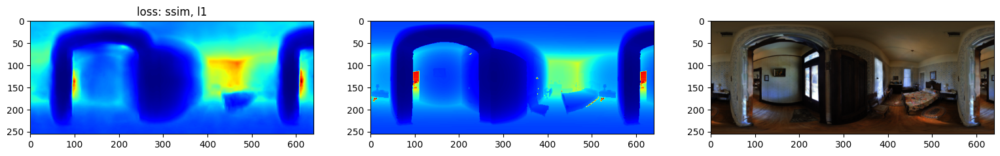

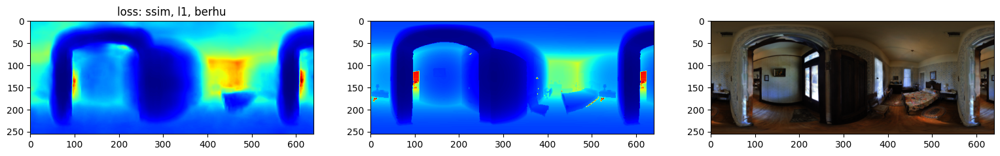

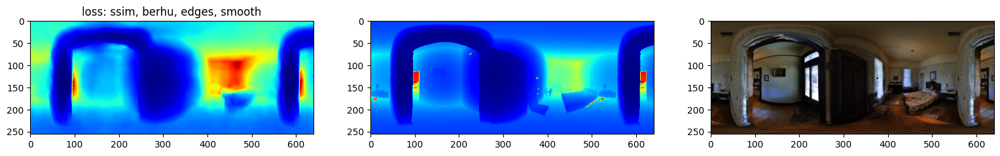

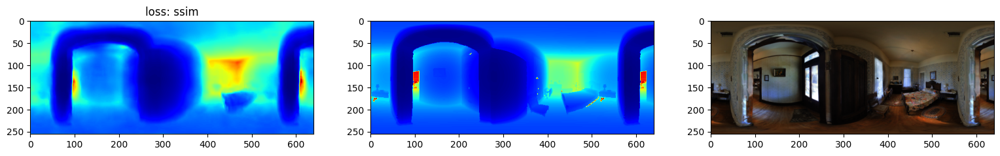

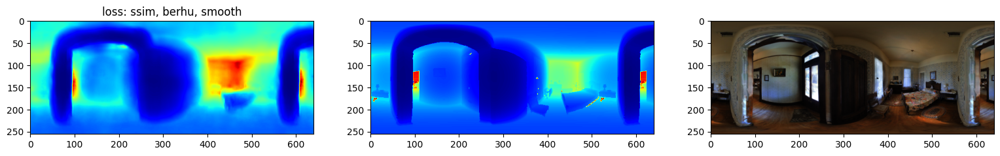

...

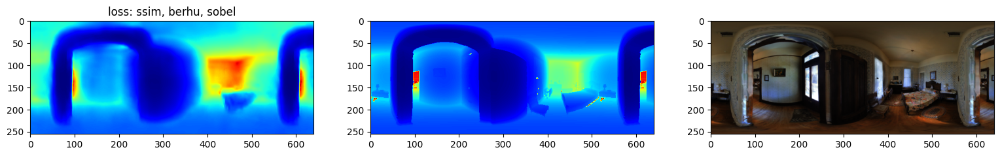

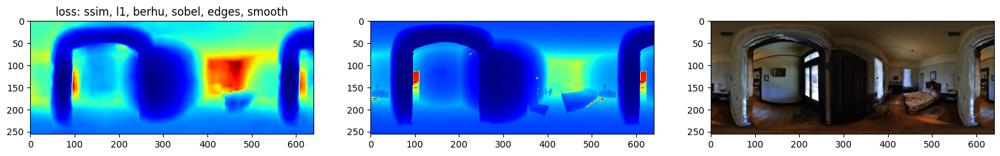

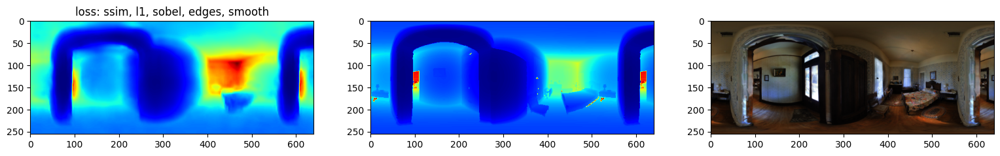

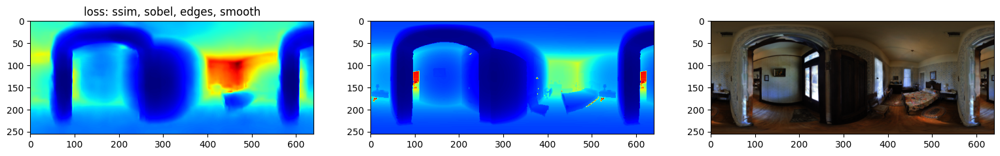

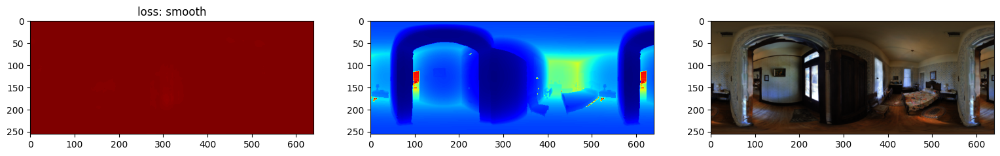

In [41]:
cmap = plt.cm.jet
cmap.set_bad(color='black')
for name, pred in resulting_images.items():
#     start = time.time()
#     print(time.time() - start)
    
    name = name.replace("./mobilenet/mobile_", "").replace(".h5", "")
    print(name)
    plt.figure(figsize=(19,10))
    plt.subplot(1,3,1)
    plt.title(f"loss: {name.replace('_', ', ')}")
    plt.imshow(pred.squeeze(), cmap=cmap)
    plt.subplot(1,3,2)
    plt.imshow(depth.squeeze(), cmap=cmap)
    plt.subplot(1,3,3)
    plt.imshow(img)
    plt.savefig(f"./resulting_imgs/{name}.png", bbox_inches='tight')
#     break

/data/awong189/miniconda/envs/thesis/lib/python3.9/site-packages/onnxruntime/capi/onnxruntime_inference_collection.py:54: UserWarning: Specified provider 'TensorrtExecutionProvider' is not in available provider names.Available providers: 'CPUExecutionProvider'
  warnings.warn(


(32, 256, 640, 1)


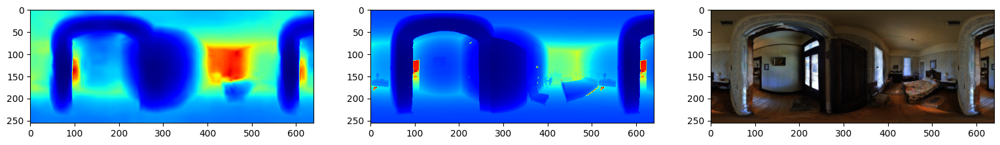

In [42]:
sess = onnxruntime.InferenceSession("mobile_diode_pano_ssim_l1_sobel_edges_old_preprocess.onnx", providers=["TensorrtExecutionProvider"])

inputs = sess.get_inputs()[0].name
output = sess.get_outputs()[0].name
preds = sess.run([output], {inputs: imgs})[0]
print(preds.shape)

cmap = plt.cm.jet
cmap.set_bad(color='black')

plt.figure(figsize=(19,10))
plt.subplot(1,3,1)
plt.imshow(preds[0].squeeze(), cmap=cmap)
plt.subplot(1,3,2)
plt.imshow(depths[0].squeeze(), cmap=cmap)
plt.subplot(1,3,3)
plt.imshow(imgs[0])
plt.savefig(f"./resulting_imgs/onnx.png", bbox_inches='tight')

(32, 256, 640, 1)


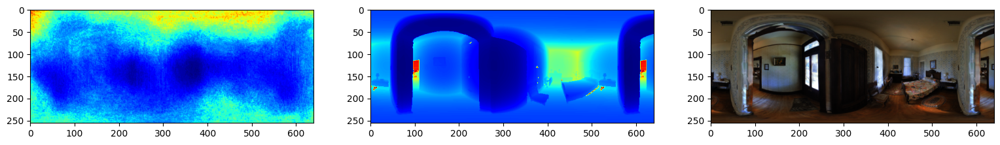

In [43]:
sess = onnxruntime.InferenceSession("mobile_diode_pano_ssim_l1_sobel_edges_old_preprocess_quant.onnx", providers=["TensorrtExecutionProvider"])

inputs = sess.get_inputs()[0].name
output = sess.get_outputs()[0].name
preds = sess.run([output], {inputs: imgs})[0]
print(preds.shape)

cmap = plt.cm.jet
cmap.set_bad(color='black')

plt.figure(figsize=(19,10))
plt.subplot(1,3,1)
plt.imshow(preds[0].squeeze(), cmap=cmap)
plt.subplot(1,3,2)
plt.imshow(depths[0].squeeze(), cmap=cmap)
plt.subplot(1,3,3)
plt.imshow(imgs[0])
plt.savefig(f"./resulting_imgs/onnx_quant.png", bbox_inches='tight')

In [44]:
import glob
from loss_utils import set_loss_function
from models.TCSVT import *

loss = set_loss_function(["ssim"])
custom_func = {"new_new_loss": loss, "loss_function": loss, "DownSampling": DownSampling, "UpSampling": UpSampling, "Scene_Understanding": Scene_Understanding }

resulting_images = {}
img = imgs[0]
depth = depths[0]

for name in glob.glob('./mobile_diode_pano*.h5'):
# for name in data:
    keras.backend.clear_session()
    print(name)
    model = tf.keras.models.load_model(name, custom_objects=custom_func)
    preds = model.predict(imgs)
    resulting_images[name] = preds[0]
#     break

./mobile_diode_pano_ssim_l1_edges_smooth_log_preprocess.h5
./mobile_diode_pano_ssim_edges_smooth_log_preprocess.h5
./mobile_diode_pano_ssim_sobel_log_preprocess_swap_relu.h5
./mobile_diode_pano_ssim_l1_sobel_edges_old_preprocess.h5
./mobile_diode_pano_ssim_sobel_edges_smooth_log_preprocess.h5


['ssim', 'l1', 'edges', 'smooth']
['ssim', 'edges', 'smooth']
['ssim', 'sobel', 'log', 'preprocess']
['ssim', 'l1', 'sobel', 'edges']
['ssim', 'sobel', 'edges', 'smooth']


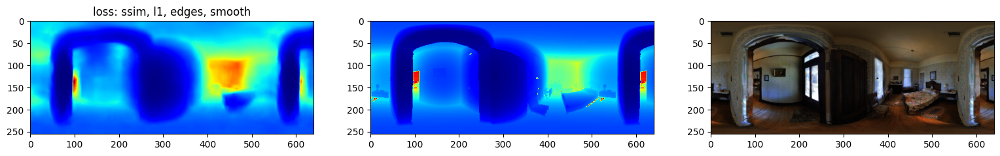

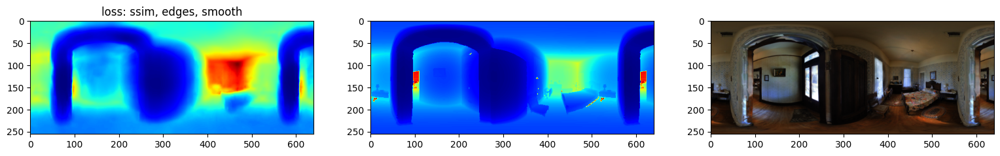

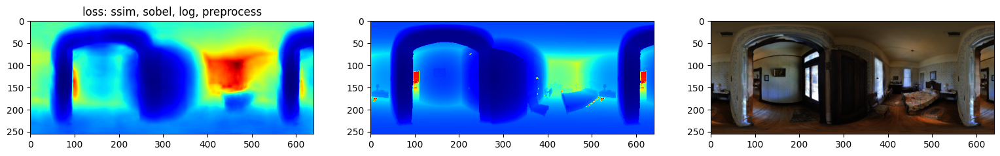

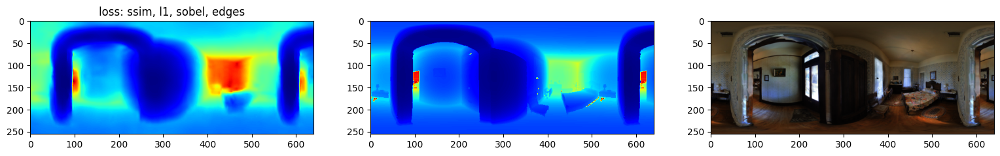

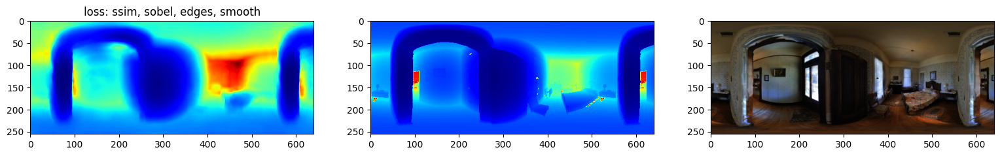

In [45]:
cmap = plt.cm.jet
cmap.set_bad(color='black')
for name, pred in resulting_images.items():
#     start = time.time()
#     print(time.time() - start)
    
    name = name.replace("./mobile_diode_pano_", "").replace(".h5", "").split("_")[:-2]
    print(name)
    plt.figure(figsize=(19,10))
    plt.subplot(1,3,1)
    plt.title(f"loss: {', '.join(name)}")
    plt.imshow(pred.squeeze(), cmap=cmap)
    plt.subplot(1,3,2)
    plt.imshow(depth.squeeze(), cmap=cmap)
    plt.subplot(1,3,3)
    plt.imshow(img)
    plt.savefig(f"./resulting_imgs/{'_'.join(name) + '_diode_pretrained'}.png", bbox_inches='tight')
#     break

In [ ]:
sess = onnxruntime.InferenceSession("mobile_diode_pano_ssim_l1_sobel_edges_old_preprocess_quant.onnx", providers=["TensorrtExecutionProvider"])
mobile_no_scene_ssim_l1_sobel_edges.history


inputs = sess.get_inputs()[0].name
output = sess.get_outputs()[0].name
preds = sess.run([output], {inputs: imgs})[0]
print(preds.shape)

cmap = plt.cm.jet
cmap.set_bad(color='black')

plt.figure(figsize=(19,10))
plt.subplot(1,3,1)
plt.imshow(preds[0].squeeze(), cmap=cmap)
plt.subplot(1,3,2)
plt.imshow(depths[0].squeeze(), cmap=cmap)
plt.subplot(1,3,3)
plt.imshow(imgs[0])
plt.savefig(f"./resulting_imgs/no_scene.png", bbox_inches='tight')

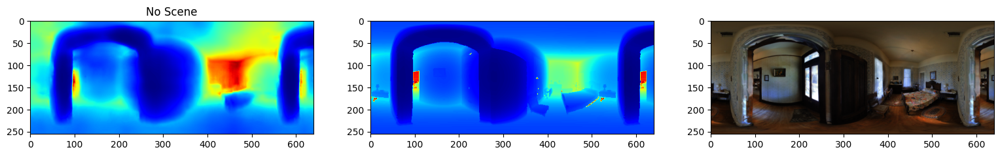

In [53]:
from loss_utils import set_loss_function

resulting_images = {}
img = imgs[0]
depth = depths[0]

loss = set_loss_function(["ssim"])
custom_func = {"new_new_loss": loss, "loss_function": loss}
keras.backend.clear_session()
model = tf.keras.models.load_model("mobile_no_scene_ssim_l1_sobel_edges.h5", custom_objects=custom_func)
preds = model.predict(imgs)
pred = preds[0]

plt.figure(figsize=(19,10))
plt.subplot(1,3,1)
plt.title(f"No Scene")
plt.imshow(pred.squeeze(), cmap=cmap)
plt.subplot(1,3,2)
plt.imshow(depth.squeeze(), cmap=cmap)
plt.subplot(1,3,3)
plt.imshow(img)
plt.savefig(f"./resulting_imgs/no_scene.png", bbox_inches='tight')

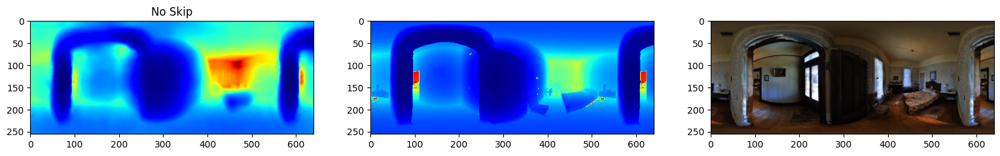

In [52]:
from loss_utils import set_loss_function

resulting_images = {}
img = imgs[0]
depth = depths[0]

loss = set_loss_function(["ssim"])
custom_func = {"new_new_loss": loss, "loss_function": loss}
keras.backend.clear_session()
model = tf.keras.models.load_model("mobile_no_skip_ssim_l1_sobel_edges.h5", custom_objects=custom_func)
preds = model.predict(imgs)
pred = preds[0]

plt.figure(figsize=(19,10))
plt.subplot(1,3,1)
plt.title(f"No Skip")
plt.imshow(pred.squeeze(), cmap=cmap)
plt.subplot(1,3,2)
plt.imshow(depth.squeeze(), cmap=cmap)
plt.subplot(1,3,3)
plt.imshow(img)
plt.savefig(f"./resulting_imgs/no_skip.png", bbox_inches='tight')